# Machine Learning : Entraînement du modèle
---
### Objectif :
- Utiliser le dataset prétraité pour entraîner notre modèle de Machine Learning.
- Évaluer les performances du modèle entraîné.

In [ ]:

import pandas as pd
import numpy as np

file_path = 'df_Train.csv'
df = pd.read_csv(file_path)

df.dtypes

# Transformer les colonnes en float64
df['dept'] = df['dept'].astype('float64')
df['year'] = df['year'].astype('float64')

# Vérifier les valeurs uniques après transformation
print(df['dept'].unique())

df.dtypes


[ 1.  3.  7. 15. 26. 38. 42. 43. 69. 73. 74.]


average_No_2           float64
average_So_2           float64
dept                   float64
average_Co             float64
avg_temperature_max    float64
week_cos               float64
indice                 float64
average_O_3            float64
average_Pm_2_5         float64
SYM23                  float64
SYM68                  float64
SYM6                   float64
SYM22                  float64
avg_pressure           float64
SYM5                   float64
average_IQA_global     float64
SYM34                  float64
SYM29                  float64
SYM8                   float64
SYM31                  float64
SYM35                  float64
SYM1                   float64
SYM3                   float64
year                   float64
nb_passage_IRA         float64
dtype: object

Nous pouvons contrôler que nos données d'entrée sont bien en float64

## LANCEMENT DU MACHINE LEARNING
Creation du Dataframe

In [3]:
import joblib
import pandas as pd
from sklearn.preprocessing import StandardScaler


target = 'nb_passage_IRA'

# Selection des features pour le modèle.
features = ['SYM1', 'SYM19', 'SYM22', 'SYM23', 'SYM26', 'SYM28', 'SYM3', 'SYM31', 'SYM32', 
            'SYM34', 'SYM35', 'SYM39', 'SYM6', 'SYM68', 'SYM8', 'average_Co', 'average_IQA_global', 
            'average_No_2', 'average_O_3', 'average_Pm_10', 'average_Pm_2_5', 'average_So_2', 
            'avg_precipitation', 'avg_pressure', 'avg_temperature_avg', 'avg_temperature_max', 
            'avg_temperature_min', 'avg_wind']

#

# Standardization des données et nous excluons de la standardisation la variable cible Nombre de passage IRA.
scaler = StandardScaler()
numerical_features = df.select_dtypes(include=['float64']).columns.difference(['nb_passage_IRA'])

# Application du StandardScaler sur les données numériques
df[numerical_features] = scaler.fit_transform(df[numerical_features])


# Sauvegarde du StandardScaler
joblib.dump(scaler, "standard_scaler.pkl")
print("✅ StandardScaler saved as 'standard_scaler.pkl'")



# Création du dataframe contenant les features standardisées
dfn = df[numerical_features]
#affichage des valeurs d'entrainement et à prédire.
print(dfn.columns.tolist())  
print(df[target])

✅ StandardScaler saved as 'standard_scaler.pkl'
['SYM1', 'SYM22', 'SYM23', 'SYM29', 'SYM3', 'SYM31', 'SYM34', 'SYM35', 'SYM5', 'SYM6', 'SYM68', 'SYM8', 'average_Co', 'average_IQA_global', 'average_No_2', 'average_O_3', 'average_Pm_2_5', 'average_So_2', 'avg_pressure', 'avg_temperature_max', 'dept', 'indice', 'week_cos', 'year']
0        172.0
1        130.0
2        364.0
3        352.0
4        478.0
         ...  
2728     340.0
2729    1240.0
2730    1246.0
2731     954.0
2732     398.0
Name: nb_passage_IRA, Length: 2733, dtype: float64


#### Création du split des données

In [4]:
from sklearn.model_selection import train_test_split

# Séparation des données d'entrainement et de test.
X = dfn[numerical_features]
y = df[target]
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=42)

 ### Création d'un GRIDSEARCH avec les différents modèles de régression en machine learning.

In [4]:
from sklearn.ensemble import RandomForestRegressor, GradientBoostingRegressor, AdaBoostRegressor
from sklearn.svm import SVR
from sklearn.tree import DecisionTreeRegressor
from sklearn.neighbors import KNeighborsRegressor
from lightgbm import LGBMRegressor
from sklearn.linear_model import LinearRegression, Lasso, Ridge
from sklearn.model_selection import GridSearchCV, KFold, train_test_split
from sklearn.metrics import make_scorer, mean_squared_error, r2_score, f1_score
import numpy as np
import pandas as pd

# Définir les modèles à tester
models = {
    'Linear Regression': LinearRegression(),
    'Lasso Regression': Lasso(),
    'Ridge Regression': Ridge(),
    'Random Forest': RandomForestRegressor(),
    'Gradient Boosting': GradientBoostingRegressor(),
    'AdaBoost': AdaBoostRegressor(),
    'SVR': SVR(),
    'Decision Tree': DecisionTreeRegressor(),
    'KNN Regressor': KNeighborsRegressor(),
    'LightGBM': LGBMRegressor()
}

# Définir les hyperparamètres à tester pour chaque modèle : GRID SEARCH
# Nous avons repris les hyperparamètres les plus couramment utilisés pour chaque modèle avec nos recherches sur internet.
param_grids = {
    'Linear Regression': {},
    'Lasso Regression': {'alpha': [0.01, 0.1, 1, 10, 100, 200]},
    'Ridge Regression': {'alpha': [0.01, 0.1, 1, 10, 100, 200]},
    'Random Forest': {
        'n_estimators': [50, 100, 200, 250, 500],
        'max_depth': [None, 10, 20, 30, 40],
        'min_samples_split': [2, 5, 10, 25],
        'min_samples_leaf': [1, 2, 4, 8, 16]
    },
    'Gradient Boosting': {
        'n_estimators': [50, 100, 200, 250],
        'learning_rate': [0.01, 0.05, 0.1, 0.2],
        'max_depth': [3, 5, 7, 9]
    },
    'AdaBoost': {
        'n_estimators': [50, 100, 200, 250],
        'learning_rate': [0.01, 0.05, 0.1, 0.5, 1.0]
    },
    'SVR': {
        'C': [0.1, 1, 10, 100, 1000],
        'epsilon': [0.01, 0.1, 0.5], 
    },
    'Decision Tree': {
        'max_depth': [None, 10, 20, 30, 40],
        'min_samples_split': [2, 5, 10, 25],
        'min_samples_leaf': [1, 2, 4,5, 8, 16]
    },
    'KNN Regressor': {
        'n_neighbors': [3, 5, 7, 9]
    },
    'LightGBM': {
        'n_estimators': [50, 100],
        'learning_rate': [ 0.05, 0.1],
        'num_leaves': [31, 50, 100],
        'min_child_samples': [20, 50, 100],
        'subsample': [0.6 , 0.8, 1.0],
        'colsample_bytree': [0.6, 0.8, 1.0]
    }
}


# Créer un DataFrame pour stocker les résultats
results_df = pd.DataFrame(columns=['Model', 'Best Params', 'R2 Score', 'MSE', 'RMSE'])

# Définir le K-Fold cross-validation
kf = KFold(n_splits=5, shuffle=True, random_state=42)

# Définir le scorer pour GridSearchCV
scorer = make_scorer(mean_squared_error, greater_is_better=False)

# Fonction pour évaluer un modèle
def evaluate_model(model, X_train, X_test, y_train, y_test, model_name, best_params):
    model.fit(X_train, y_train)
    y_pred = model.predict(X_test)
    r2 = r2_score(y_test, y_pred)
    mse = mean_squared_error(y_test, y_pred)
    rmse = np.sqrt(mse)
    # Conversion des valeurs prédites en entiers
    y_pred_rounded = np.round(y_pred).astype(int)
    results_df.loc[len(results_df)] = [model_name, best_params, r2, mse, rmse]

# Effectuer la recherche sur grille pour chaque modèle
for model_name, model in models.items():
    grid_search = GridSearchCV(estimator=model, param_grid=param_grids[model_name], cv=kf, scoring=scorer, n_jobs=-1, verbose=2)
    grid_search.fit(X_train, y_train)
    best_model = grid_search.best_estimator_
    best_params = grid_search.best_params_
    evaluate_model(best_model, X_train, X_test, y_train, y_test, model_name, best_params)

# Afficher les résultats
print(results_df)

Fitting 5 folds for each of 1 candidates, totalling 5 fits
[CV] END .................................................... total time=   0.0s[CV] END .................................................... total time=   0.0s

[CV] END .................................................... total time=   0.0s
[CV] END .................................................... total time=   0.0s
[CV] END .................................................... total time=   0.0s
Fitting 5 folds for each of 6 candidates, totalling 30 fits
[CV] END ...........................................alpha=10; total time=   0.0s
[CV] END ..........................................alpha=100; total time=   0.0s
[CV] END ..........................................alpha=100; total time=   0.0s
[CV] END ..........................................alpha=100; total time=   0.0s
[CV] END ..........................................alpha=100; total time=   0.0s
[CV] END ..........................................alpha=100; total tim

 ## Affichage des résultats des différents modèles de Machine Learning

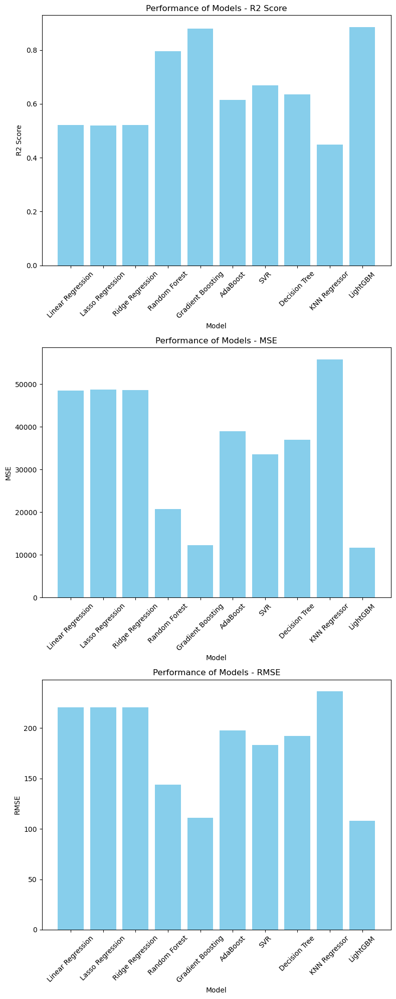

In [5]:
import matplotlib.pyplot as plt

# Define the metrics to plot
metrics = ['R2 Score', 'MSE', 'RMSE']

# Create a figure with subplots for each metric
fig, axes = plt.subplots(3 , 1, figsize=(8, 20))
axes = axes.flatten()

# Plot each metric
for i, metric in enumerate(metrics):
    axes[i].bar(results_df['Model'], results_df[metric], color='skyblue')
    axes[i].set_title(f'Performance of Models - {metric}')
    axes[i].set_xlabel('Model')
    axes[i].set_ylabel(metric)
    axes[i].tick_params(axis='x', rotation=45)

# Adjust the spacing between subplots
plt.tight_layout()
plt.show()

 ### Nous pouvons donc observer les différents résultats de notre étude. Les modeles de régression qui nous permettent d'avoir le meilleur score en MSE, RMSE et R2 sont : Gradient Bosting, LightGBM. 

## Affichage des prédictions par rapport aux valeurs de test

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000250 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2783
[LightGBM] [Info] Number of data points in the train set: 2186, number of used features: 24
[LightGBM] [Info] Start training from score 276.498170


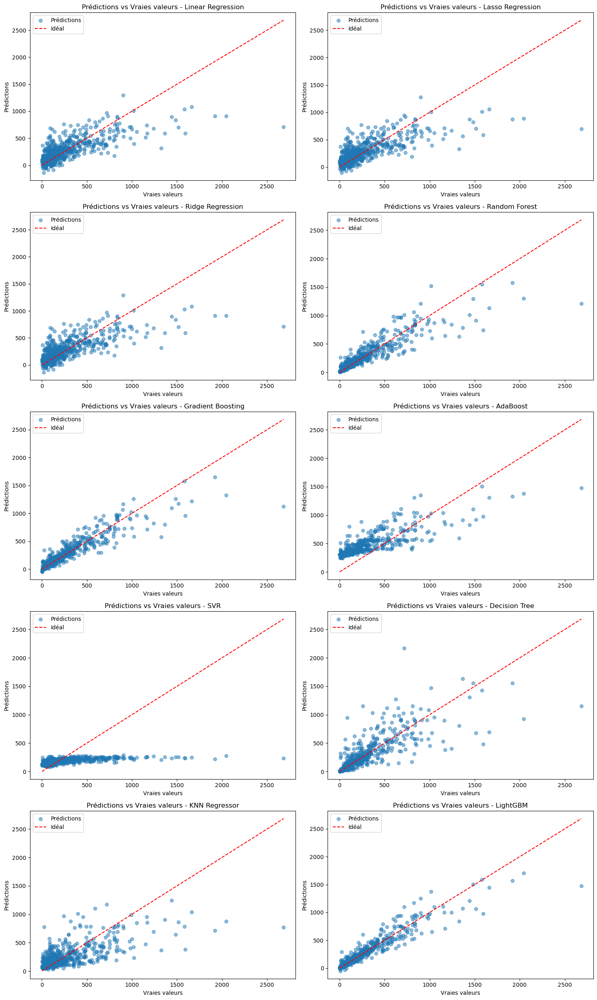

In [6]:
import matplotlib.pyplot as plt

# Fonction qui trace les prédictions par rapport aux valeurs réelles
def plot_predictions_vs_actual(model, model_name, X_test, y_test, ax):
    y_pred = model.predict(X_test)
    ax.scatter(y_test, y_pred, alpha=0.5, label="Prédictions")
    ax.plot([y_test.min(), y_test.max()], [y_test.min(), y_test.max()], 'r--', label="Idéal")
    ax.set_xlabel("Vraies valeurs")
    ax.set_ylabel("Prédictions")
    ax.legend()
    ax.set_title(f"Prédictions vs Vraies valeurs - {model_name}")

# Creation d'un subplot pour chaque modèle
fig, axes = plt.subplots(5, 2, figsize=(15, 25))
axes = axes.flatten()

# Itération des modèles et affichage des prédictions
for i, (model_name, model) in enumerate(models.items()):
    model.fit(X_train, y_train)  # Fit the model
    plot_predictions_vs_actual(model, model_name, X_test, y_test, axes[i])

# Adjust layout
plt.tight_layout()
plt.show()



#### Les courbes du lightGBM sont compactes et suivent la courbe idéale d'apprentissage

### Vérification de l'overfitting

In [7]:
from sklearn.metrics import mean_squared_error, r2_score

# Prédiction sur le jeu d'entraînement
y_train_pred = best_model.predict(X_train)
mse_train = mean_squared_error(y_train, y_train_pred)
r2_train = r2_score(y_train, y_train_pred)

# Prédiction sur le jeu de test
y_test_pred = best_model.predict(X_test)
mse_test = mean_squared_error(y_test, y_test_pred)
r2_test = r2_score(y_test, y_test_pred)

# Afficher les performances du modèle avec le MSE et le R²
print("=== Performance sur le jeu d'entraînement ===")
print("MSE :", mse_train)
print("R²  :", r2_train)

print("\n=== Performance sur le jeu de test ===")
print("MSE :", mse_test)
print("R²  :", r2_test)


=== Performance sur le jeu d'entraînement ===
MSE : 1055.1269839688102
R²  : 0.9886639257816525

=== Performance sur le jeu de test ===
MSE : 11644.758720386762
R²  : 0.885152689559755


# Méthode de vérification de l'overfitting

## Cas d'un Overfitting suspecté :
- **MSE** très faible et **R²** proche de 1 sur l'ensemble d'entraînement
- **MSE** élevé et **R²** faible sur l'ensemble de test

## Cas d'un bon équilibre :
- Valeurs de **MSE** et **R²** proches entre l'entraînement et le test

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000090 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 886
[LightGBM] [Info] Number of data points in the train set: 174, number of used features: 24
[LightGBM] [Info] Start training from score 309.994253
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, 

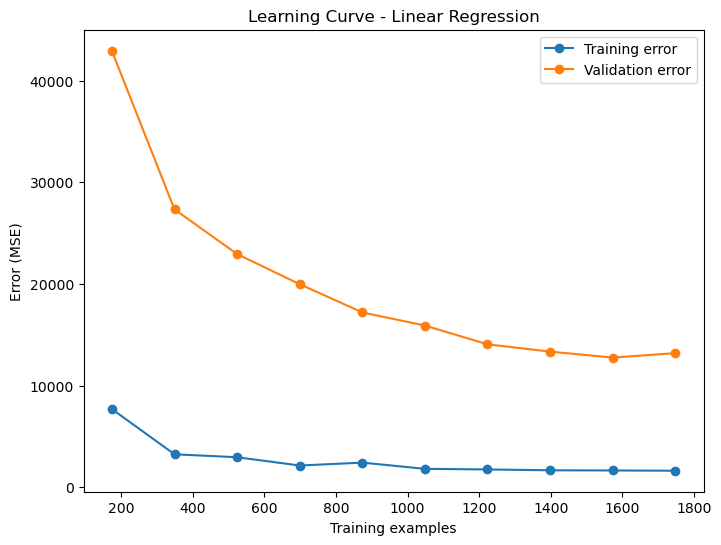

In [8]:
import matplotlib.pyplot as plt
from sklearn.model_selection import learning_curve
 
# Fonction pour tracer les courbes d'apprentissage
def plot_learning_curve(model, X, y, title="Learning Curve"):
    train_sizes, train_scores, test_scores = learning_curve(
        model, X, y, cv=5, scoring="neg_mean_squared_error", train_sizes=np.linspace(0.1, 1.0, 10), random_state=42
    )
    train_mean = -np.mean(train_scores, axis=1)
    test_mean = -np.mean(test_scores, axis=1)
 
    plt.figure(figsize=(8, 6))
    plt.plot(train_sizes, train_mean, 'o-', label="Training error")
    plt.plot(train_sizes, test_mean, 'o-', label="Validation error")
    plt.xlabel("Training examples")
    plt.ylabel("Error (MSE)")
    plt.title(title)
    plt.legend()
    plt.show()
 
# Appliquer la courbe d'apprentissage au modèle de régression linéaire
plot_learning_curve(model, X_train, y_train, title="Learning Curve - Linear Regression")

### Nous observons les points suivants sur notre modèle : 

 ####  Point positif :
    - Erreur de validation diminue le nombre d'entrainement
    - Le modèle apprend à généraliser son apprentissage 
    - La courbe d'entrainement est stable 

#### Point négatif : 
    - Underfitting entre la courbe de training et de validation. 
    - Nous observons un plafond de l'apprentissage à partir de 1400 training

 #### Conclusion : l'ajout de donnée ne peut plus réduire l'erreur.
 #### Nous allons essayer de reduire l'overfitting du modèle avec un réglage précis de notre meilleur modèle.


 ### Nous relançons un nouvel entrainement avec des hyperparamètres précis pour limiter l'overfitting de notre modèle.

In [9]:
import lightgbm as lgb
from sklearn.model_selection import train_test_split
from sklearn.metrics import mean_squared_error, r2_score
import matplotlib.pyplot as plt

# Séparation du jeu d'entraînement en sous-ensemble pour l'early stopping
X_train_sub, X_val, y_train_sub, y_val = train_test_split(
    X_train, y_train, test_size=0.2, random_state=42
)
#Nous nous sommes basés sur les meilleurs hyperparamètres trouvés lors de la recherche grid search.	
# Nouvelle grille de paramètres
params = {
    'boosting_type': 'gbdt',    # Type de boosting
    'class_weight': None,       # Poids des classes
    'learning_rate': 0.06,  # Taux d'apprentissage
    'max_depth': -1,            # Profondeur maximale
    'min_child_samples': 20,    # Nombre minimal d'échantillons par enfant
    'min_child_weight': 0.001,     # Poids minimal des enfants  
    'min_split_gain': 0.0,          # Gain minimal pour effectuer un split
    'n_estimators': 100, # Nombre d'estimators
    'n_jobs': None,       # Nombre de jobs
    'num_leaves': 31,   # Nombre de feuilles
    'objective': None,  # Objectif
    'random_state': 42,     
    'subsample_for_bin': 200000,        # Sous-échantillonnage pour les bins
    'lambda_l1': 2.0,          # Régularisation L1 renforcée
    'lambda_l2': 2.0,          # Régularisation L2 renforcée
    'feature_fraction': 0.75,  # Sous-échantillonnage à 75%
    'bagging_fraction': 0.75,  # Sous-échantillonnage des données à 75%
    'bagging_freq': 5          # Bagging toutes les 5 itérations
}

# Création des datasets pour LightGBM
lgb_train = lgb.Dataset(X_train_sub, y_train_sub)
lgb_val = lgb.Dataset(X_val, y_val, reference=lgb_train)

# Dictionnaire pour enregistrer l'évolution des métriques
evals_result = {}

# Entraînement avec early stopping + enregistrement de l'évolution via callback
gbm = lgb.train(
    params,
    lgb_train,
    num_boost_round=3000,  # On peut dépasser 100 si on veut laisser l'early stopping decider.
    valid_sets=[lgb_train, lgb_val],
    valid_names=['train', 'valid'],
    callbacks=[
        lgb.early_stopping(stopping_rounds=100),
        lgb.log_evaluation(period=20),
        lgb.record_evaluation(evals_result)
    ]
)

# Évaluation sur le jeu de validation
y_val_pred = gbm.predict(X_val, num_iteration=gbm.best_iteration)
mse_val = mean_squared_error(y_val, y_val_pred)
r2_val = r2_score(y_val, y_val_pred)
rmse_val = mse_val ** 0.5

print("=== Validation Set Metrics ===")
print(f"MSE  : {mse_val:.2f}")
print(f"RMSE : {rmse_val:.2f}")
print(f"R²   : {r2_val:.4f}")

# Évaluation finale sur le jeu de test
y_test_pred = gbm.predict(X_test, num_iteration=gbm.best_iteration)
mse_test = mean_squared_error(y_test, y_test_pred)
r2_test = r2_score(y_test, y_test_pred)
rmse_test = mse_test ** 0.5

print("\n=== Test Set Metrics ===")
print(f"MSE  : {mse_test:.2f}")
print(f"RMSE : {rmse_test:.2f}")
print(f"R²   : {r2_test:.4f}")


# -------------------------------------------
# PLOTTER LA LEARNING CURVE
# -------------------------------------------
# Au lieu de 'rmse', la racine carré de 'l2' :
train_MSE = evals_result['train']['l2']
valid_MSE = evals_result['valid']['l2']


[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000606 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2777
[LightGBM] [Info] Number of data points in the train set: 1748, number of used features: 24
[LightGBM] [Info] Start training from score 272.509725
Training until validation scores don't improve for 100 rounds
[20]	train's l2: 26057.4	valid's l2: 40517
[40]	train's l2: 12097.1	valid's l2: 26203.4
[60]	train's l2: 7746.02	valid's l2: 20829.7
[80]	train's l2: 5565.98	valid's l2: 18305.6
[100]	train's l2: 4416.1	valid's l2: 17686.2
Did not meet early stopping. Best iteration is:
[100]	train's l2: 4416.1	valid's l2: 17686.2
=== Validation Set Metrics ===
MSE  : 17686.16
RMSE : 132.99
R²   : 0.8275

=== Test Set Metrics ===
MSE  : 16604.82
RMSE : 128.86
R²   : 0.8362


 ### Nous avons un R² Score correct par rapport à nos attentes. Nous observons que l'écart entre les valeurs de test et les valeurs de validation est faible.

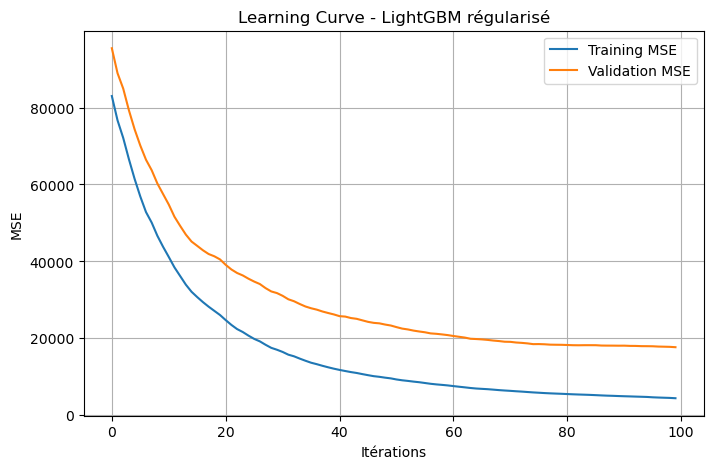

In [10]:
plt.figure(figsize=(8, 5))
plt.plot(train_MSE, label='Training MSE')
plt.plot(valid_MSE, label='Validation MSE')
plt.xlabel("Itérations")
plt.ylabel("MSE")
plt.title("Learning Curve - LightGBM régularisé")
plt.legend()
plt.grid(True)
plt.show()

 ### Suite à la modification des hyperparametres du modele lightGBM, nous avons fortement limité l'overfitting. Nous observons aussi que le modèle continu son apprentissage avec le training. 

In [11]:
import joblib

# Save the LightGBM model to a file
joblib_file = "lightgbm_model ML OK.pkl"
joblib.dump(gbm, joblib_file)

print(f"Le modèle LightGBM a été sauvegardé dans le fichier : {joblib_file}")

Le modèle LightGBM a été sauvegardé dans le fichier : lightgbm_model ML OK.pkl


# Test du Modèle

Ce notebook permet de charger des données nouvelles à partir du fichier `df_indust_mapped.csv`, de prétraiter ces données pour créer les features attendues (y compris une transformation cyclique pour la colonne `week`), de charger un StandardScaler et un modèle LightGBM sauvegardés, d'effectuer des prédictions, de calculer des métriques de performance (si la cible est présente), de construire une colonne `date` à partir des colonnes `year` et `week` et enfin de sauvegarder le résultat dans un fichier CSV.

In [ ]:
import pandas as pd
import numpy as np
import joblib
from math import cos, pi
import datetime
from sklearn.metrics import mean_squared_error, mean_absolute_error, r2_score


# Chargement du fichier CSV contenant les nouvelles données
df = pd.read_csv("df_Test_Indust.csv")



### Prétraitement des Données

Dans ce bloc, nous créons la colonne **week_cos** à partir de la colonne **week** en appliquant une transformation cyclique (cosinus). 
Ensuite, nous vérifions que le DataFrame contient les 24 colonnes attendues par le scaler et nous réordonnons le DataFrame pour respecter l'ordre exact.

In [8]:
# --- Création de la colonne 'week_cos' à partir de 'week' ---
if 'week' in df.columns:
    df['week_cos'] = df['week'].apply(lambda w: cos(2 * pi * w / 52))
else:
    print("La colonne 'week' est absente du CSV. Impossible de calculer 'week_cos'.")

# --- Vérification et réordonnancement des colonnes pour le scaler ---
expected_cols = [
    'SYM1', 'SYM22', 'SYM23', 'SYM29', 'SYM3', 'SYM31', 'SYM34', 'SYM35', 'SYM5',
    'SYM6', 'SYM68', 'SYM8', 'average_Co', 'average_IQA_global', 'average_No_2',
    'average_O_3', 'average_Pm_2_5', 'average_So_2', 'avg_pressure',
    'avg_temperature_max', 'dept', 'indice', 'week_cos', 'year'
]

# Identifier les colonnes manquantes et supplémentaires
missing_cols = [col for col in expected_cols if col not in df.columns]
extra_cols   = [col for col in df.columns if col not in expected_cols]

if missing_cols:
    print("Colonnes manquantes après transformation :", missing_cols)

if extra_cols:
    print("Colonnes supplémentaires dans le CSV :", extra_cols)

# Réordonner le DataFrame pour ne conserver que les colonnes attendues, dans le bon ordre
try:
    X = df[expected_cols]
except KeyError as e:
    print("Erreur lors du réordonnancement :", e)
    raise

Colonnes supplémentaires dans le CSV : ['week', 'avg_temperature_min', 'avg_temperature_avg', 'avg_precipitation', 'avg_wind', 'nb_passage_IRA', 'average_Pm_10', 'SYM21', 'SYM24', 'SYM28', 'SYM19', 'SYM39', 'SYM26', 'SYM32']


### Chargement du Modèle, Prédiction et Calcul des Métriques

Dans ce bloc, nous chargeons le StandardScaler et le modèle LightGBM sauvegardés. 
Nous mettons ensuite à l'échelle les données, réalisons la prédiction et, si la colonne cible **nb_passage_IRA** est présente, nous calculons les métriques de performance : MSE, MAE, R² et RMSE.

In [9]:
# --- Chargement du scaler et du modèle, mise à l'échelle et prédiction ---
scaler = joblib.load("standard_scaler.pkl")
model = joblib.load("lightgbm_model ML OK.pkl")

# Mise à l'échelle des features
X_scaled = scaler.transform(X)

# Prédiction avec le modèle LightGBM (objet Booster)
predictions = model.predict(X_scaled)
df['prediction'] = predictions

# --- Calcul des métriques de performance si la cible est présente ---
if 'nb_passage_IRA' in df.columns:
    y_true = df['nb_passage_IRA']
    mse = mean_squared_error(y_true, predictions)
    mae = mean_absolute_error(y_true, predictions)
    r2 = r2_score(y_true, predictions)
    rmse = np.sqrt(mse)
    print(f"MSE : {mse:.4f}")
    print(f"MAE : {mae:.4f}")
    print(f"R2 Score : {r2:.4f}")
    print(f"RMSE : {rmse:.2f}")
else:
    print("La colonne cible 'nb_passage_IRA' n'est pas présente. Impossible de calculer les métriques.")

MSE : 5872.0679
MAE : 44.4340
R2 Score : 0.9228
RMSE : 76.63


### Création de la Colonne Date et Sauvegarde des Résultats

Dans ce dernier bloc, nous construisons une colonne **date** à partir des colonnes **year** et **week**. 
La date correspond au lundi de la semaine ISO donnée. 
Ensuite, nous créons un DataFrame résultat qui contient la cible (**nb_passage_IRA**), la prédiction, l'écart absolu (**ecart**) et la colonne **date**.
Enfin, nous sauvegardons ce DataFrame dans un fichier CSV.

In [10]:
# --- Création de la colonne 'date' à partir de 'year' et 'week' ---
if 'year' in df.columns and 'week' in df.columns:
    df['date'] = df.apply(lambda row: datetime.date.fromisocalendar(int(row['year']), int(row['week']), 1), axis=1)
    df['date'] = pd.to_datetime(df['date'])
else:
    print("Les colonnes 'year' et/ou 'week' sont absentes, impossible de créer la colonne 'date'.")

# --- Ajout de la colonne 'prediction' ---
if 'prediction' not in df.columns:
    df['prediction'] = model.predict(scaler.transform(df[expected_cols]))

# --- Création et sauvegarde du DataFrame final ---
if 'nb_passage_IRA' in df.columns:
    df_result = df[['dept','date', 'nb_passage_IRA', 'prediction']].copy()
    df_result['ecart'] = abs(df_result['nb_passage_IRA'] - df_result['prediction'])
    df_result.to_csv("resultats_prediction_nb_passage_IRA.csv", index=False)
    print("Le DataFrame résultat a été sauvegardé dans 'resultats_prediction_nb_passage_IRA.csv'.")
else:
    print("La colonne cible 'nb_passage_IRA' est absente du DataFrame final.")

Le DataFrame résultat a été sauvegardé dans 'resultats_prediction_nb_passage_IRA.csv'.
